Train Model

GPUs detected: 2
Found 12279 files belonging to 7 classes.
Found 1530 files belonging to 7 classes.
Found 1530 files belonging to 7 classes.
Found 475 files belonging to 7 classes.
Number of devices: 2
Epoch 1/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.3418 - loss: 4.4479
Epoch 1: val_accuracy improved from -inf to 0.57124, saving model to raf_db_resnet50_best_model.keras
96/96 ━━━━━━━━━━━━━━━━━━━━ 223s 2s/step - accuracy: 0.3426 - loss: 4.4438 - val_accuracy: 0.5712 - val_loss: 3.6004 - learning_rate: 2.0000e-04
Epoch 2/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5277 - loss: 3.5131
Epoch 2: val_accuracy improved from 0.57124 to 0.57908, saving model to raf_db_resnet50_best_model.keras
96/96 ━━━━━━━━━━━━━━━━━━━━ 170s 2s/step - accuracy: 0.5278 - loss: 3.5119 - val_accuracy: 0.5791 - val_loss: 3.1985 - learning_rate: 2.0000e-04
Epoch 3/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5894 - loss: 3.0777
Epoch 3: val_accuracy improved from 0.57908 to 0.64314

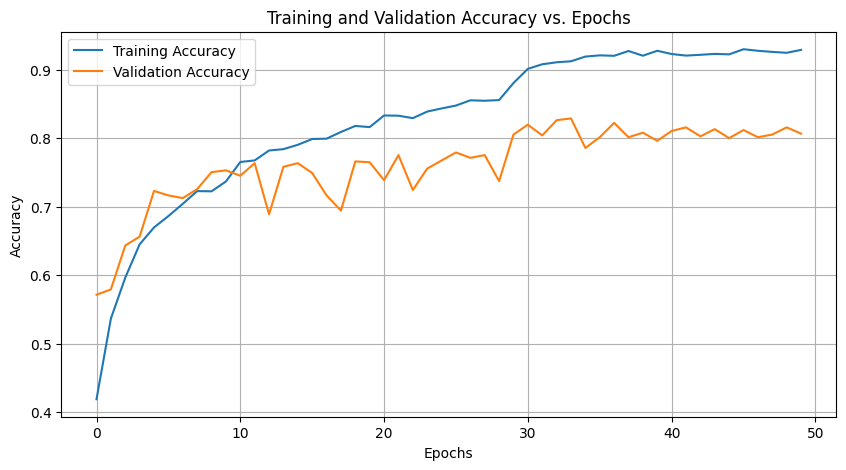

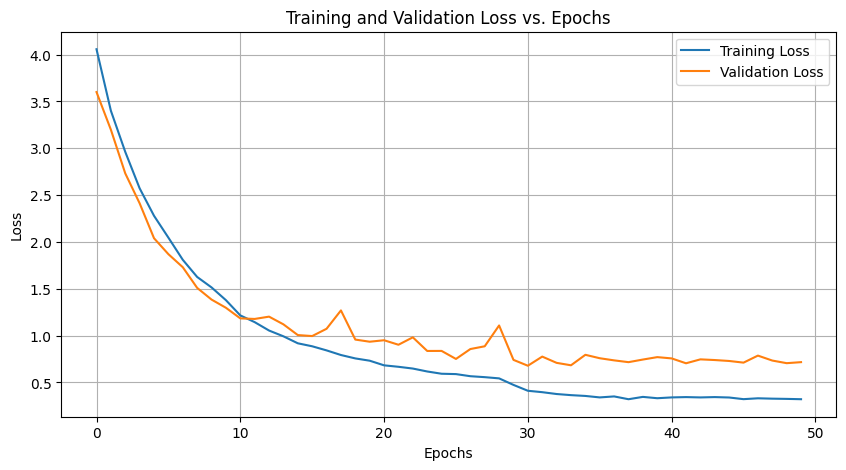

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.regularizers import l2
import matplotlib.pyplot as plt

# Ensure TensorFlow uses the GPUs
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print(f"GPUs detected: {len(gpus)}")
    except RuntimeError as e:
        print(f"Error enabling GPU: {e}")

# Enable mixed precision training for faster computations
tf.keras.mixed_precision.set_global_policy("mixed_float16")

# Dataset directories
original_train_dir = '/kaggle/input/cps843-custom-raf-db/DATASET/train'
original_val_dir = '/kaggle/input/cps843-custom-raf-db/DATASET/val'
original_test_dir = '/kaggle/input/cps843-custom-raf-db/DATASET/test'
original_custom_dataset_dir = '/kaggle/input/cps843-custom-raf-db/DATASET/custom_dataset'

# Parameters
image_size = (224, 224)  # ResNet50 requires 224x224 input
batch_size = 128
num_classes = 7  # Update if the number of classes differs
base_learning_rate = 0.0001  # Base learning rate
epochs = 50

# Data augmentation layers
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomZoom(0.2),
])

# Use tf.data for efficient input pipeline with augmentation
def prepare_dataset(directory, augment=False):
    dataset = tf.keras.preprocessing.image_dataset_from_directory(
        directory,
        label_mode="categorical",
        image_size=image_size,
        batch_size=batch_size
    )
    if augment:
        dataset = dataset.map(lambda x, y: (data_augmentation(x), y))
    dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE)  # Prefetch to optimize performance
    return dataset

train_dataset = prepare_dataset(original_train_dir, augment=True)  # Apply augmentation to training data
val_dataset = prepare_dataset(original_val_dir, augment=False)  # No augmentation for val data
test_dataset = prepare_dataset(original_test_dir, augment=False)  # No augmentation for test data
custom_dataset = prepare_dataset(original_custom_dataset_dir, augment=False)  # No augmentation for custom data

# Enable multi-GPU training with MirroredStrategy
strategy = tf.distribute.MirroredStrategy()
print(f"Number of devices: {strategy.num_replicas_in_sync}")

with strategy.scope():
    # Load ResNet50 pretrained on ImageNet
    base_model = ResNet50(input_shape=(224, 224, 3), include_top=False, weights='imagenet')

    # Fine-tune part of the model
    base_model.trainable = True
    for layer in base_model.layers[:-10]:  # Freeze all but the last 10 layers
        layer.trainable = False

    # Add custom classification head with regularization
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dropout(0.5)(x)  # Dropout for regularization
    x = Dense(128, activation='relu', kernel_regularizer=l2(0.01))(x)  # Add L2 regularization
    x = Dropout(0.5)(x)
    output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.01), dtype='float32')(x)  # Ensure float32 for output

    # Create the model
    model = Model(inputs=base_model.input, outputs=output)

    # Scale learning rate with the number of GPUs
    learning_rate = base_learning_rate * strategy.num_replicas_in_sync

    # Compile the model with mixed precision optimizer
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer,
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

# Callbacks for better training
checkpoint = ModelCheckpoint("raf_db_resnet50_best_model.keras", monitor='val_accuracy', save_best_only=True, verbose=1)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, verbose=1, min_lr=1e-6)

# Train the model
history = model.fit(
    train_dataset,
    epochs=epochs,
    validation_data=val_dataset,
    callbacks=[checkpoint, reduce_lr],
    verbose=1
)

# Evaluate the model
print("Val evaluation")
val_loss, val_accuracy = model.evaluate(val_dataset)
print(f"Val Loss: {val_loss}")
print(f"Val Accuracy: {val_accuracy}")

print("Test evaluation")
test_loss, test_accuracy = model.evaluate(test_dataset)
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

print("Custom Dataset evaluation")
custom_loss, custom_accuracy = model.evaluate(custom_dataset)
print(f"Custom Dataset Loss: {custom_loss}")
print(f"Custom Dataset Accuracy: {custom_accuracy}")

# Save the final model
model.save("raf_db_resnet50_final_model.keras")

# Plot training history
def plot_training_history(history):
    # Plot accuracy
    plt.figure(figsize=(10, 5))
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Training and Validation Accuracy vs. Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot loss
    plt.figure(figsize=(10, 5))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Training and Validation Loss vs. Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

plot_training_history(history)


Generate Confusion Matrix

Found 1530 files belonging to 7 classes.

Classification Report for Validation Dataset:
              precision    recall  f1-score   support

       angry       0.72      0.79      0.76        86
     disgust       0.49      0.39      0.44        87
        fear       0.39      0.46      0.42        35
       happy       0.94      0.89      0.91       595
     neutral       0.78      0.76      0.77       320
         sad       0.75      0.83      0.79       246
    surprise       0.77      0.85      0.81       161

    accuracy                           0.81      1530
   macro avg       0.69      0.71      0.70      1530
weighted avg       0.81      0.81      0.81      1530



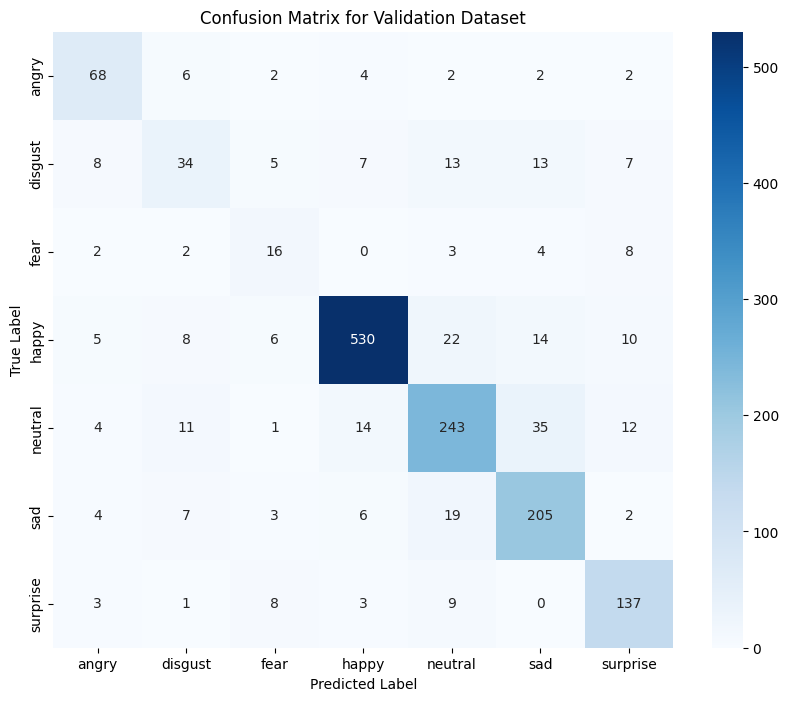

Found 1530 files belonging to 7 classes.

Classification Report for Test Dataset:
              precision    recall  f1-score   support

       angry       0.71      0.81      0.76        86
     disgust       0.59      0.47      0.52        87
        fear       0.55      0.66      0.60        35
       happy       0.93      0.86      0.90       595
     neutral       0.73      0.69      0.71       320
         sad       0.70      0.77      0.73       246
    surprise       0.68      0.83      0.75       161

    accuracy                           0.78      1530
   macro avg       0.70      0.73      0.71      1530
weighted avg       0.79      0.78      0.78      1530



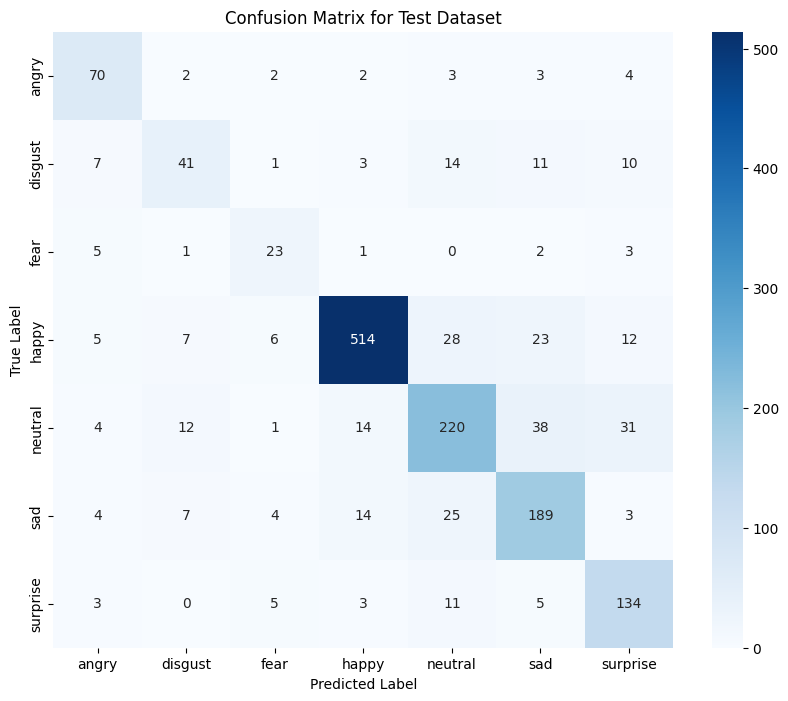

Found 475 files belonging to 7 classes.

Classification Report for Custom Dataset:
              precision    recall  f1-score   support

       anger       0.29      0.10      0.15        60
     disgust       0.00      0.00      0.00        72
        fear       0.50      0.04      0.08        45
       happy       0.27      0.39      0.32       118
     neutral       0.16      0.35      0.22        85
         sad       0.05      0.12      0.07        33
    surprise       0.44      0.13      0.20        62

    accuracy                           0.20       475
   macro avg       0.25      0.16      0.15       475
weighted avg       0.24      0.20      0.18       475



/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


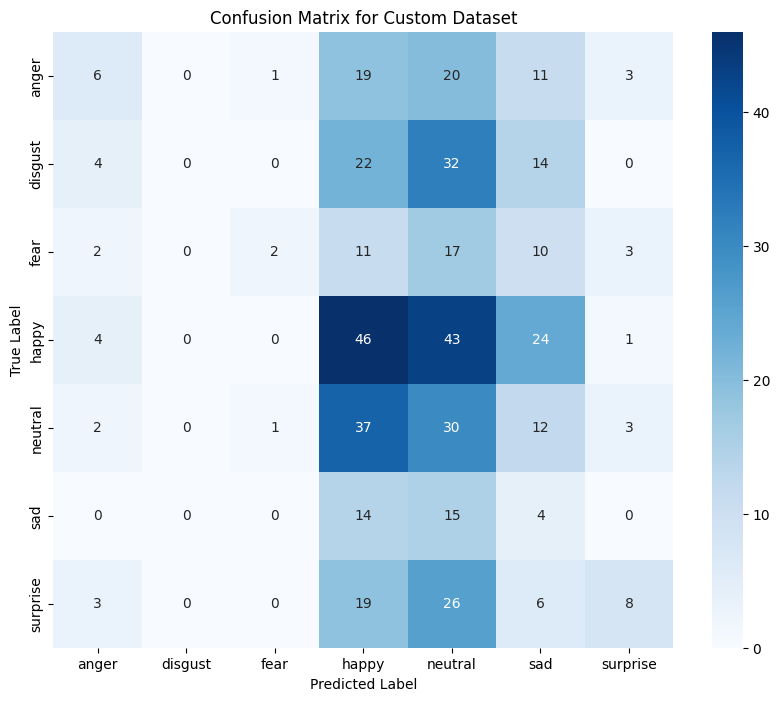

Found 475 files belonging to 7 classes.

Classification Report for Custom Dataset 2:
              precision    recall  f1-score   support

       anger       0.22      0.08      0.12        60
     disgust       0.00      0.00      0.00        72
        fear       0.43      0.07      0.12        45
       happy       0.39      0.22      0.28       118
     neutral       0.21      0.44      0.28        85
         sad       0.09      0.42      0.14        33
    surprise       0.39      0.24      0.30        62

    accuracy                           0.21       475
   macro avg       0.25      0.21      0.18       475
weighted avg       0.26      0.21      0.20       475



/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


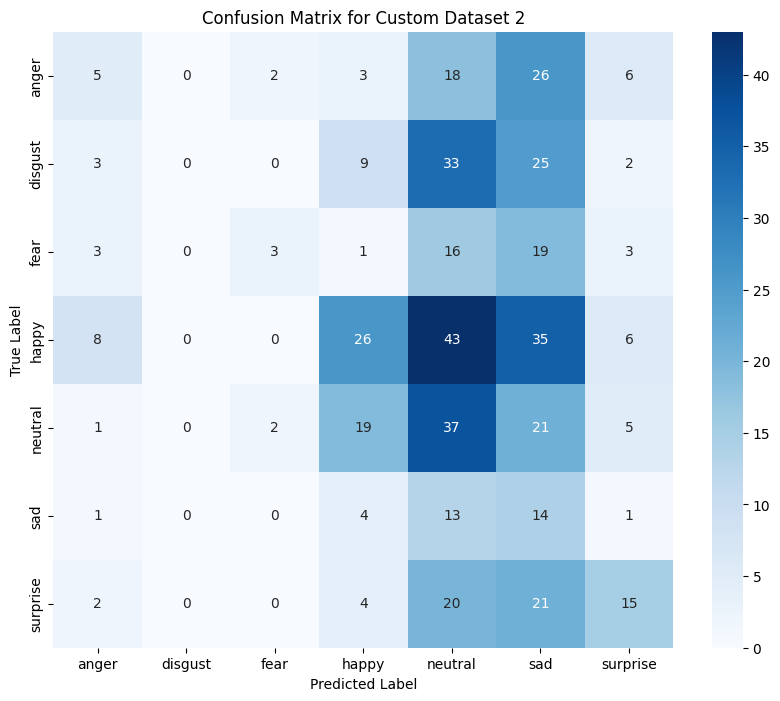

In [13]:
import os
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# Load the trained model
model_path = '/kaggle/working/raf_db_resnet50_best_model.keras'  # Update the path to your saved model
model = tf.keras.models.load_model(model_path)

# Parameters
img_size = (224, 224)
batch_size = 128

# Directories
val_data_dir = '/kaggle/input/cps843-custom-raf-db/DATASET/val'
test_data_dir = '/kaggle/input/cps843-custom-raf-db/DATASET/test'
custom_data_dir = '/kaggle/input/cps843-custom-raf-db/DATASET/custom_dataset'
custom_data2_dir = '/kaggle/input/custom-dataset2-224x224/custom_dataset_224x224'

# Function to evaluate a dataset and generate confusion matrix
def evaluate_and_plot_confusion_matrix(data_dir, title):
    # Load dataset
    dataset = tf.keras.preprocessing.image_dataset_from_directory(
        data_dir,
        image_size=img_size,
        batch_size=batch_size,
        label_mode='categorical',
        shuffle=False  # Ensure consistent order of samples
    )
    
    # Extract class names and prefetch dataset
    class_names = dataset.class_names
    num_classes = len(class_names)
    dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE)

    # Initialize variables
    conf_matrix = np.zeros((num_classes, num_classes), dtype=int)
    true_labels = []
    predicted_labels = []

    # Predict and populate the confusion matrix
    for images, labels in dataset:
        # Store true labels
        true_labels_batch = np.argmax(labels.numpy(), axis=1)
        true_labels.extend(true_labels_batch)

        # Make predictions
        predictions = model.predict(images, verbose=0)
        predicted_labels_batch = np.argmax(predictions, axis=1)
        predicted_labels.extend(predicted_labels_batch)

        # Update confusion matrix
        for true_label, pred_label in zip(true_labels_batch, predicted_labels_batch):
            conf_matrix[true_label, pred_label] += 1

    # Convert to numpy arrays
    true_labels = np.array(true_labels)
    predicted_labels = np.array(predicted_labels)

    # Print the classification report
    print(f"\nClassification Report for {title}:")
    print(classification_report(true_labels, predicted_labels, target_names=class_names))

    # Plot the confusion matrix
    plt.figure(figsize=(10, 8))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.title(f"Confusion Matrix for {title}")
    plt.ylabel("True Label")
    plt.xlabel("Predicted Label")
    plt.show()

# Generate confusion matrices for all datasets
evaluate_and_plot_confusion_matrix(val_data_dir, "Validation Dataset")
evaluate_and_plot_confusion_matrix(test_data_dir, "Test Dataset")
evaluate_and_plot_confusion_matrix(custom_data_dir, "Custom Dataset")
evaluate_and_plot_confusion_matrix(custom_data2_dir, "Custom Dataset 2")

Display Image Grid

Found 1530 files belonging to 7 classes.
Found 1530 files belonging to 7 classes.


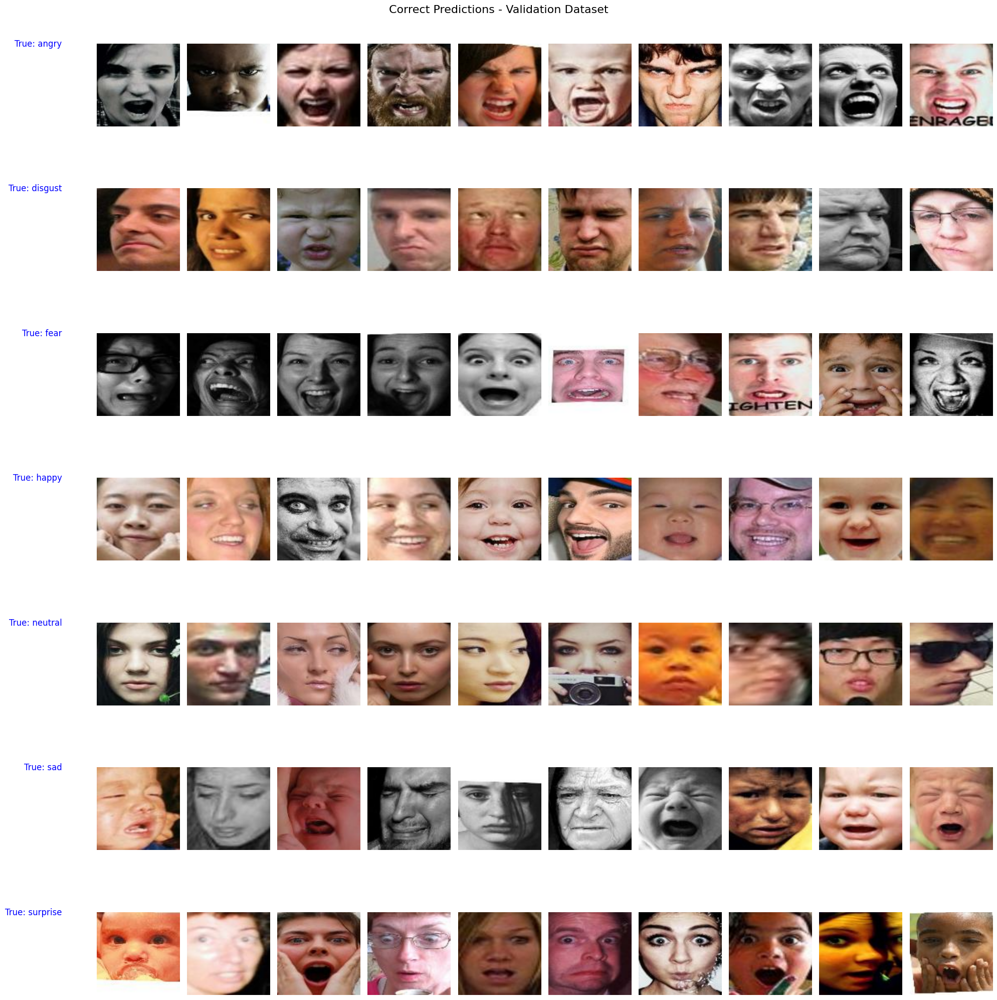

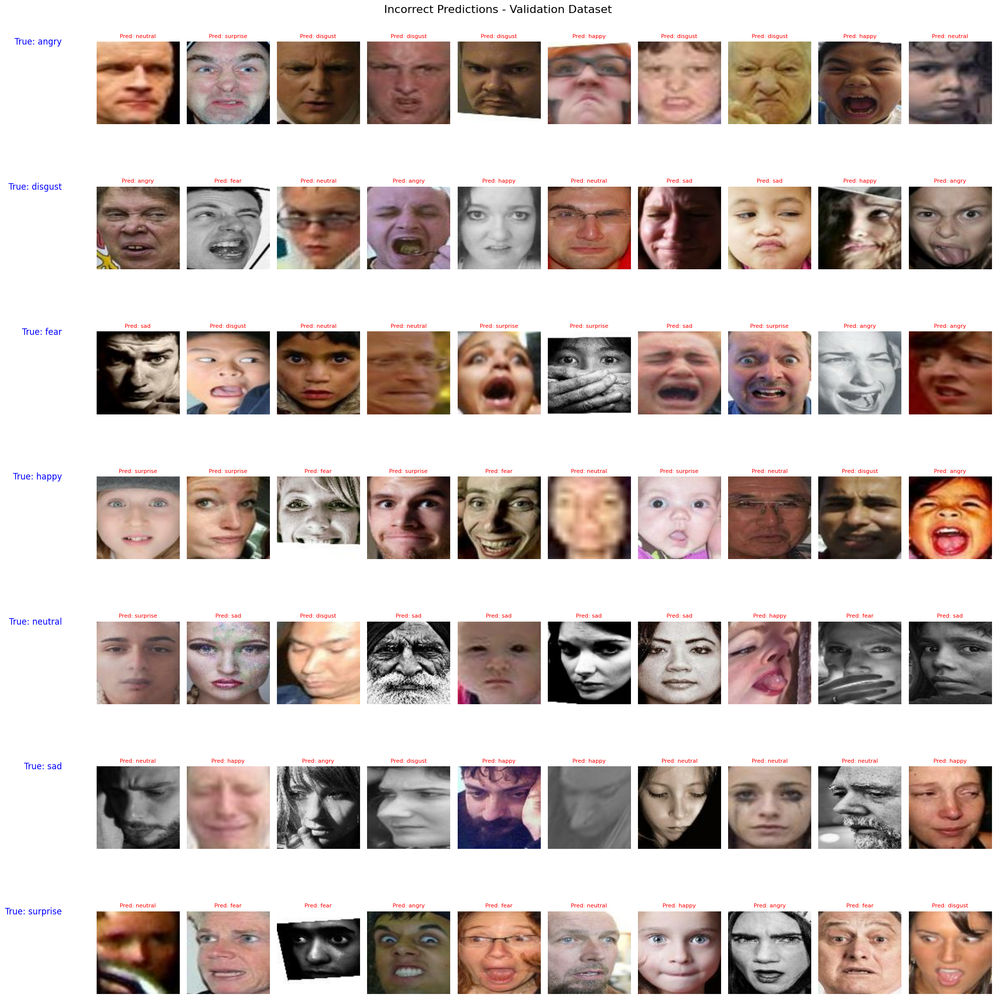

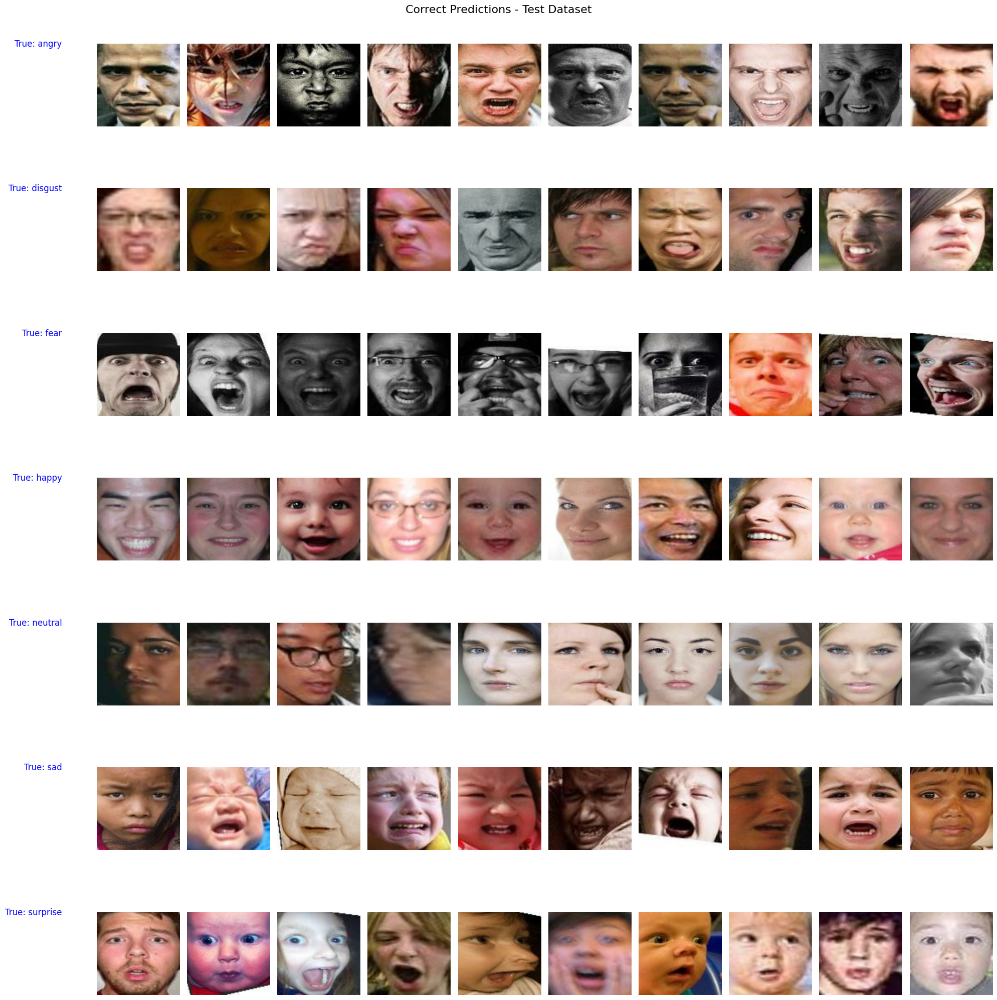

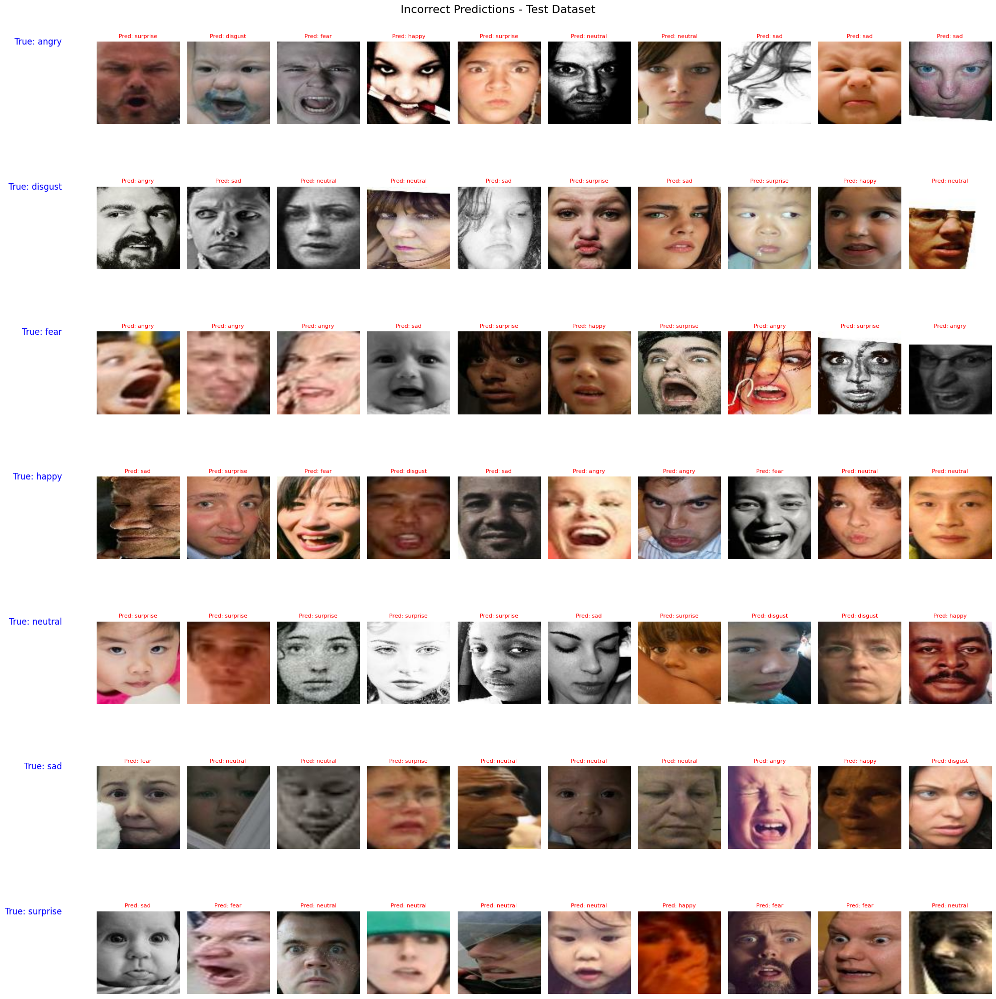

In [16]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Hard-coded directories
val_data_dir = '/kaggle/input/cps843-custom-raf-db/DATASET/val'
test_data_dir = '/kaggle/input/cps843-custom-raf-db/DATASET/test'
model_path = '/kaggle/working/raf_db_resnet50_best_model.keras'

# Load the trained model
model = tf.keras.models.load_model(model_path)

# Parameters
img_size = (224, 224)
batch_size = 128

# Function to load the dataset with shuffling
def load_dataset(data_dir):
    dataset = tf.keras.preprocessing.image_dataset_from_directory(
        data_dir,
        image_size=img_size,
        batch_size=batch_size,
        label_mode='categorical',
        shuffle=False  # Preserve consistent order
    )
    return dataset

# Function to display images in a 7x10 grid
def display_images(dataset, title, correct=True):
    class_names = dataset.class_names
    num_classes = len(class_names)

    # Initialize storage for images
    images_by_class = {i: [] for i in range(num_classes)}
    predictions_by_class = {i: [] for i in range(num_classes)}  # For incorrect predictions

    # Predict and collect images
    for images, labels in dataset:
        true_labels = np.argmax(labels.numpy(), axis=1)
        predictions = model.predict(images, verbose=0)
        predicted_labels = np.argmax(predictions, axis=1)

        for i in range(len(images)):
            is_correct = (true_labels[i] == predicted_labels[i])
            if is_correct == correct and len(images_by_class[true_labels[i]]) < 10:
                images_by_class[true_labels[i]].append(images[i])
                if not correct:  # Store predicted labels for incorrect predictions
                    predictions_by_class[true_labels[i]].append(predicted_labels[i])

    # Plot the grid
    fig, axes = plt.subplots(num_classes, 10, figsize=(20, num_classes * 3))  # Increased row height
    fig.suptitle(title, fontsize=16)

    for row in range(num_classes):
        for col in range(10):
            ax = axes[row, col]
            if col < len(images_by_class[row]):
                ax.imshow(images_by_class[row][col].numpy().astype("uint8"))
                ax.axis('off')
                if not correct:  # Add predicted label for incorrect predictions
                    pred_class = predictions_by_class[row][col]
                    ax.set_title(f"Pred: {class_names[pred_class]}", fontsize=8, color='red')
            else:
                ax.axis('off')

        # Add a visible label for each row
        axes[row, 0].annotate(
            f"True: {class_names[row]}",
            xy=(0, 0),
            xytext=(-50, 0),
            textcoords="offset points",
            fontsize=12,
            color='blue',
            rotation=0,
            ha="right",
            va="center",
        )

    plt.tight_layout(h_pad=3)  # Increase vertical padding between rows
    plt.show()

# Load validation and test datasets
val_dataset = load_dataset(val_data_dir)
test_dataset = load_dataset(test_data_dir)

# Display correct predictions for validation dataset
display_images(val_dataset, "Correct Predictions - Validation Dataset", correct=True)

# Display incorrect predictions for validation dataset
display_images(val_dataset, "Incorrect Predictions - Validation Dataset", correct=False)

# Display correct predictions for test dataset
display_images(test_dataset, "Correct Predictions - Test Dataset", correct=True)

# Display incorrect predictions for test dataset
display_images(test_dataset, "Incorrect Predictions - Test Dataset", correct=False)
